In [1]:
# importing necessary libraries and configurations
import pandas as pd
import matplotlib.pyplot as plt

from fbprophet import Prophet
from fbprophet.plot import plot_plotly
from fbprophet.plot import add_changepoints_to_plot

plt.style.use("classic")
%matplotlib inline

In [2]:
# loading the data set
df = pd.read_csv("df_01.csv")

In [3]:
# data cleaning and indexing
drop = ["zip_code", "latitude", "longitude"]
df.drop(drop, axis=1, inplace=True)
df.occurred_date = df.occurred_date.astype("datetime64")
df.set_index(["occurred_date"], inplace=True)
df.sort_index(inplace=True)

# examining the new dataframe
display(df.shape)
display(df.head())
display(df.tail())

(168161, 14)

,highest_offense_description,family_violence,report_date_time,location_type,address,council_district,apd_sector,apd_district,clearance_status,clearance_date,year,month,week,day
occurred_date,,,,,,,,,,,,,,
2003-01-01,AGG ASSAULT,N,2003-01-01 03:39:00,STREETS / HWY / ROAD / ALLEY,500 E 6TH OLD PECAN ST,NaN,GE,3.0,N,NaN,2003,1,1,1
2003-01-01,SUSPICIOUS PERSON,N,2003-01-01 22:01:00,STREETS / HWY / ROAD / ALLEY,600 E 7TH ST,9.0,GE,2.0,N,2003-01-11 00:00:00,2003,1,1,1
2003-01-01,ASSAULT ON PUBLIC SERVANT,N,2003-01-01 01:35:00,STREETS / HWY / ROAD / ALLEY,400 BLOCK W 6TH ST,9.0,GE,1.0,C,2003-01-06 00:00:00,2003,1,1,1
2003-01-01,PURSE SNATCHING,N,2003-01-02 16:53:00,STREETS / HWY / ROAD / ALLEY,100 W 4TH ST,9.0,GE,1.0,N,NaN,2003,1,1,1
2003-01-01,CRIMINAL MISCHIEF,N,2003-01-01 11:48:00,PARKING LOTS / GARAGE,200 E 9TH ST,9.0,GE,1.0,N,NaN,2003,1,1,1


,highest_offense_description,family_violence,report_date_time,location_type,address,council_district,apd_sector,apd_district,clearance_status,clearance_date,year,month,week,day
occurred_date,,,,,,,,,,,,,,
2020-12-24,ASSAULT BY CONTACT,N,2020-12-24 14:23:00,STREETS / HWY / ROAD / ALLEY,300 BLOCK CONGRESS AVE,9.0,GE,4.0,N,2020-12-26 00:00:00,2020,12,52,24
2020-12-26,ASSAULT BY THREAT,N,2020-12-26 11:10:00,STREETS / HWY / ROAD / ALLEY,500 CONGRESS AVE,9.0,GE,1.0,NaN,NaN,2020,12,52,26
2020-12-26,CRIMINAL MISCHIEF,N,2020-12-26 21:04:00,STREETS / HWY / ROAD / ALLEY,700 RIVER ST,9.0,GE,3.0,NaN,NaN,2020,12,52,26
2020-12-26,ASSAULT WITH INJURY,N,2020-12-26 02:42:00,STREETS / HWY / ROAD / ALLEY,E 6TH ST / SAN JACINTO BLVD,9.0,GE,2.0,NaN,NaN,2020,12,52,26
2020-12-26,THEFT,N,2020-12-26 00:23:00,BAR / NIGHT CLUB,406 E 6TH ST,9.0,GE,2.0,C,2020-12-26 00:00:00,2020,12,52,26


In [4]:
# Creating violent crime and murder data frames for analysis
df_viol = df.query(
    'highest_offense_description == ["AGG ASSAULT", "AGG ROBBERY/DEADLY WEAPON", "CAPITAL MURDER", "MURDER", "RAPE"]'
)
df_viol_mur = df.query('highest_offense_description == ["MURDER", "CAPITAL MURDER"]')

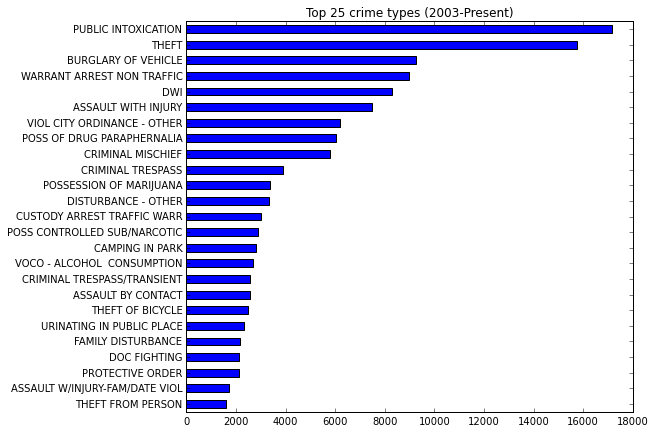

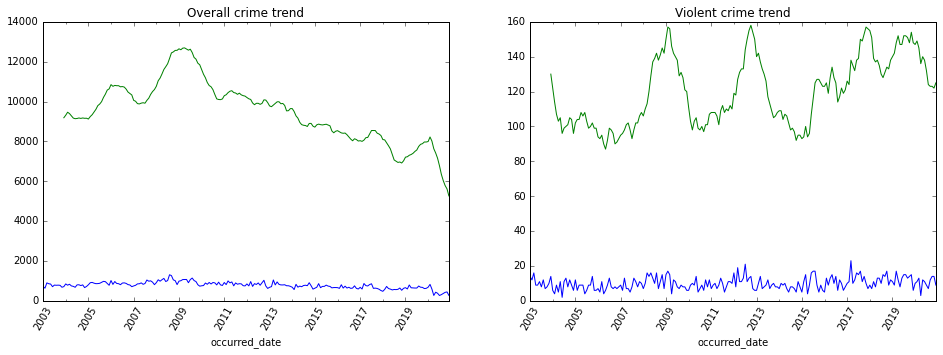

In [5]:
# Top 25 crime types
df.highest_offense_description.value_counts().head(25).sort_values().plot.barh(
    title="Top 25 crime types (2003-Present)", figsize=(8, 7)
)
plt.show()

# Visualizing trends (overall, violent, and murder)
fig, axs = plt.subplots(ncols=2, figsize=(16, 5))
df.resample("M").size().plot(ax=axs[0])
df.resample("M").size().rolling(12).sum().plot(
    title="Overall crime trend", rot=60, ax=axs[0]
)
df_viol.resample("M").size().plot(ax=axs[1])
df_viol.resample("M").size().rolling(12).sum().plot(
    title="Violent crime trend", rot=60, ax=axs[1]
)
plt.show()

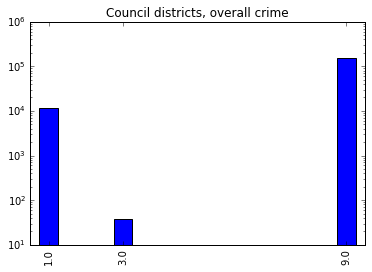

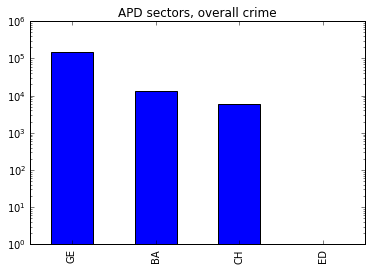

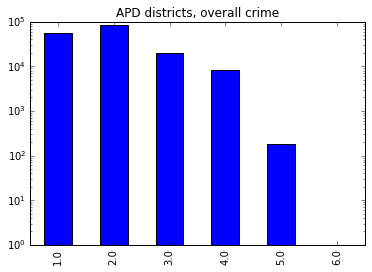

In [6]:
# Visualizing overall crime rates by council districts, APD districts, and sectors
df.council_district.value_counts().plot.bar(
    title="Council districts, overall crime", logy=True
)
plt.show()

df.apd_sector.value_counts().plot.bar(title="APD sectors, overall crime", logy=True)
plt.show()

df.apd_district.value_counts().plot.bar(title="APD districts, overall crime", logy=True)
plt.show()

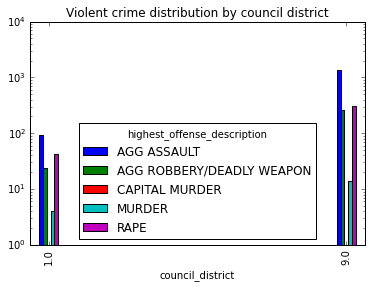

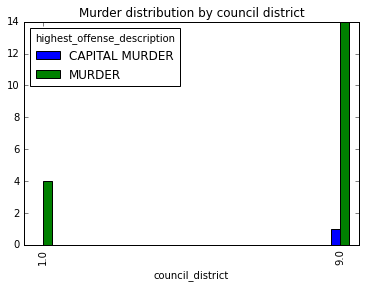

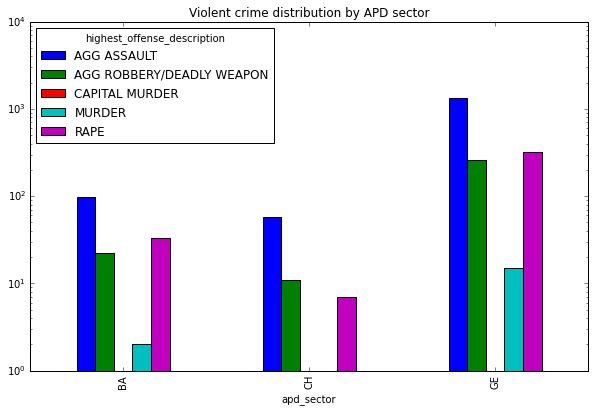

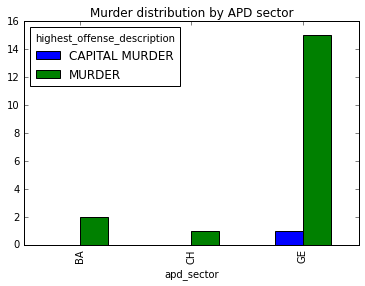

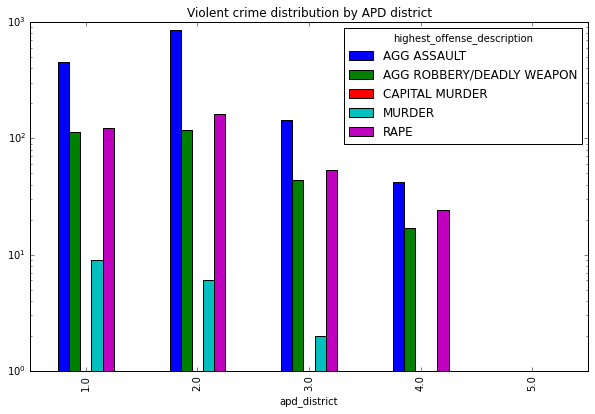

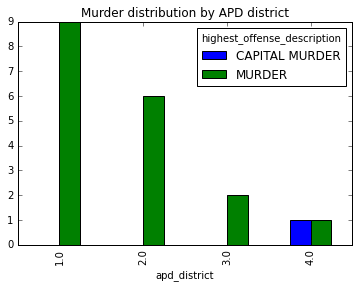

In [7]:
# Visualizing violent crime and murder rates by council districts, APD districts, and sectors
pd.crosstab(df_viol.council_district, df_viol.highest_offense_description).plot.bar(
    # figsize=(10, 6.25),
    logy=True,
    title="Violent crime distribution by council district",
)
plt.show()

pd.crosstab(
    df_viol_mur.council_district, df_viol_mur.highest_offense_description
).plot.bar(title="Murder distribution by council district")
plt.show()

pd.crosstab(df_viol.apd_sector, df_viol.highest_offense_description).plot.bar(
    figsize=(10, 6.25), logy=True, title="Violent crime distribution by APD sector"
)
plt.show()

pd.crosstab(df_viol_mur.apd_sector, df_viol_mur.highest_offense_description).plot.bar(
    title="Murder distribution by APD sector"
)
plt.show()

pd.crosstab(df_viol.apd_district, df_viol.highest_offense_description).plot.bar(
    figsize=(10, 6.25), logy=True, title="Violent crime distribution by APD district"
)
plt.show()

pd.crosstab(df_viol_mur.apd_district, df_viol_mur.highest_offense_description).plot.bar(
    title="Murder distribution by APD district"
)
plt.show()

highest_offense_description,AGG ASSAULT,AGG ROBBERY/DEADLY WEAPON,CAPITAL MURDER,MURDER,RAPE
location_type,,,,,
ABANDONED/CONDEMNED STRUCTURE,3,2,0,1,1
AMUSEMENT PARK,0,1,0,0,0
BANKS / SAVINGS & LOAN,1,5,0,0,0
BAR / NIGHT CLUB,236,5,0,0,37
CAMP / CAMPGROUND,0,0,0,0,1
CHURCH / SYNAGOGUE / TEMPLE / MOSQUE,6,1,0,0,2
COMMERCIAL / OFFICE BUILDING,17,7,0,0,4
COMMUNITY CENTER,2,0,0,0,0
CONSTRUCTION SITE,4,1,0,0,1


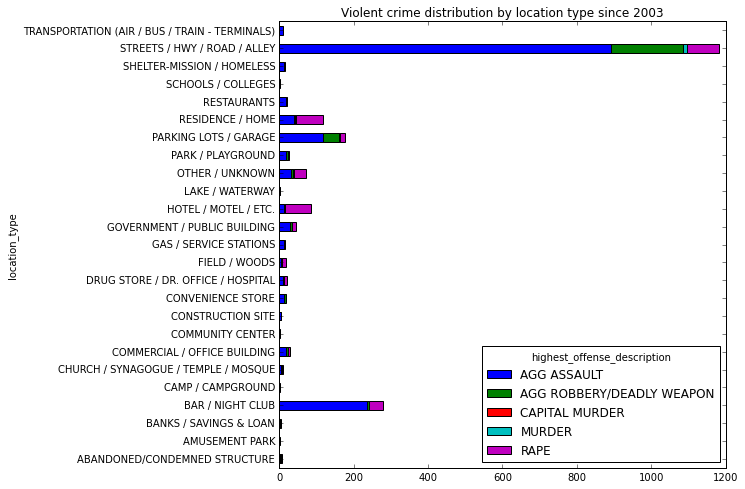

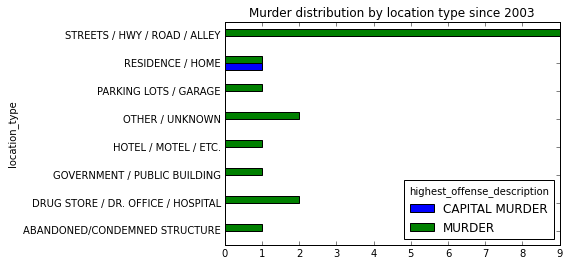

In [11]:
viol_loc = pd.crosstab(df_viol.location_type, df_viol.highest_offense_description)
display(viol_loc)

mur_loc = pd.crosstab(
    df_viol_mur.location_type, df_viol_mur.highest_offense_description
)

viol_loc.plot.barh(
    figsize=(8, 8),
    title="Violent crime distribution by location type since 2003",
    stacked=True,
)
plt.show()

mur_loc.plot.barh(
    title="Murder distribution by location type since 2003"
)
plt.show()

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


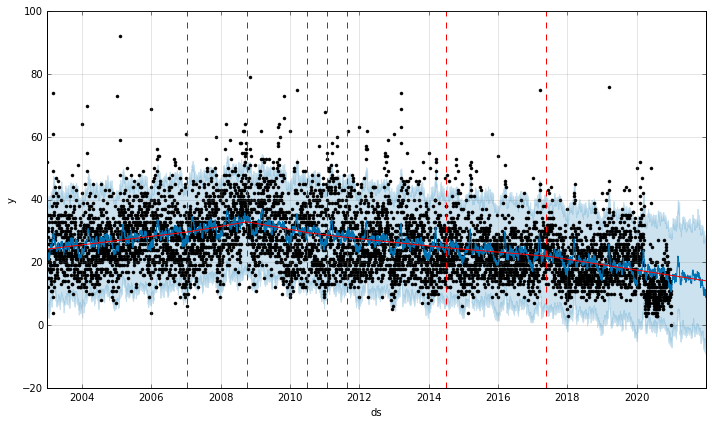

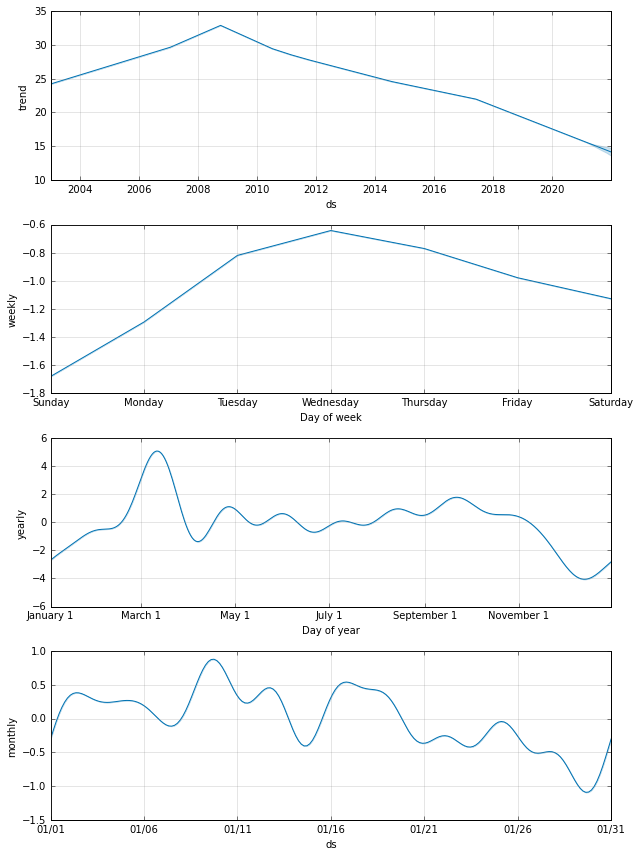

In [9]:
# forecasting for overall crime
df_fbprophet = df

df_m = df_fbprophet.resample("D").size().reset_index()
df_m.columns = ["date", "daily_crime_count"]
df_m_final = df_m.rename(columns={"date": "ds", "daily_crime_count": "y"})

m = Prophet(interval_width=0.95)
m.add_seasonality(name="monthly", period=30.5, fourier_order=10)
m.add_seasonality(name="weekly", period=52, fourier_order=10)
m.fit(df_m_final)

future = m.make_future_dataframe(periods=365, freq="D")

forecast = m.predict(future)

fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

fig2 = m.plot_components(forecast)
fig2_1 = plot_plotly(m, forecast)
fig2_1

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


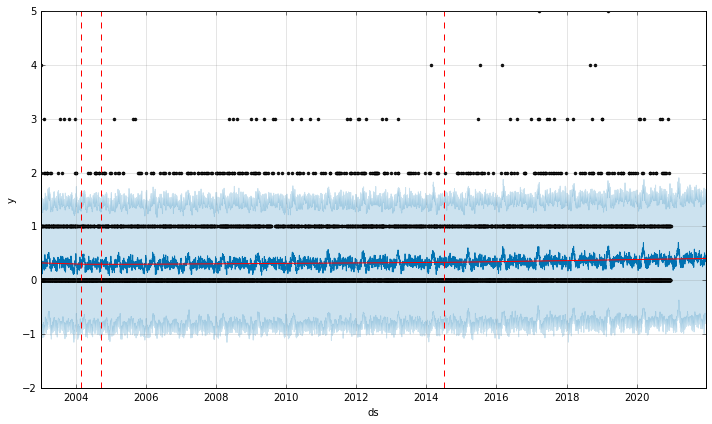

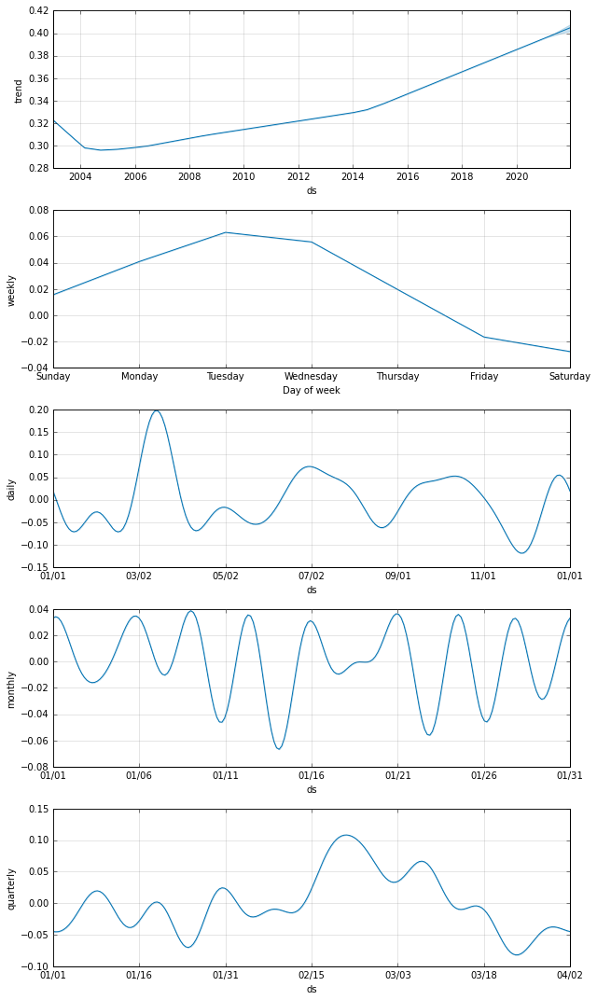

In [10]:
# forecasting for violent crime
df_viol_fbprophet = df_viol

df_viol_n = df_viol_fbprophet.resample("D").size().reset_index()
df_viol_n.columns = ["date", "daily_crime_count"]
df_viol_n_final = df_viol_n.rename(columns={"date": "ds", "daily_crime_count": "y"})

n = Prophet(interval_width=0.95, yearly_seasonality=False)
n.add_seasonality(name="monthly", period=30.5, fourier_order=10)
n.add_seasonality(name="quarterly", period=91.5, fourier_order=10)
n.add_seasonality(name="weekly", period=52, fourier_order=10)
n.add_seasonality(name="daily", period=365, fourier_order=10)
n.fit(df_viol_n_final)

future = n.make_future_dataframe(periods=365, freq="D")
forecast = n.predict(future)

fig = n.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), n, forecast)

fig3 = n.plot_components(forecast)
fig3_1 = plot_plotly(n, forecast)
fig3_1